In [1]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, UpSampling1D, LeakyReLU
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adadelta, Adam, Nadam, RMSprop, Adamax
from tensorflow.keras.callbacks import ModelCheckpoint

import librosa 
import librosa.output as output
import librosa.display

import IPython.display as ipd
from tqdm.notebook import tqdm

from time import time

 \textbf{Autoencoder типа спектр-сигнал. Сжатие в 64 раза от 514 до 8.}

In [2]:
gpu = tf.config.experimental.list_physical_devices('GPU')[0]
tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
sr = 16000
n_freq = 257
n_window = 128
n_sec = 2
length = n_window * 125 * n_sec - 1
batch_size = 32

In [111]:
length

31999

# Files

In [4]:
# ternovsky
fol1 = "data_tern_1"
fol2 = "data_tern_2"
fol3 = "data_tern_3"
files1 = [fol1 +"//"+str(i)+".npy" for i in range(100)]
files2 = [fol2 +"//"+str(i)+".npy" for i in range(233)]
files3 = [fol3 +"//"+str(i)+".npy" for i in range(100)]
path1 = files2

In [5]:
# borzunov
fol1 = "data_borz_1"
fol2 = "data_borz_2"
files1 = [fol1 +"//"+str(i)+".npy" for i in range(100)]
files2 = [fol2 +"//"+str(i)+".npy" for i in range(203)]
path2 = files2

In [6]:
# vorobeva 
fol2 = "data_voro_2"
fol3 = "data_voro_3"
# files1 = [fol2 +"//"+str(i)+".npy" for i in range(54)]
files2 = [fol2 +"//"+str(i)+".npy" for i in range(54)]
files3 = [fol3 +"//"+str(i)+".npy" for i in range(87)]
path3 = files3

In [7]:
fol1 = "data_eriz_1"
files1 = [fol1 +"//"+str(i)+".npy" for i in range(268)]
path4 = files1

#  Функции

## Оптимизаторы

In [8]:
adam   =   Adam(learning_rate=0.0002, beta_1=0.9, beta_2=0.99, amsgrad=False)
adam2  =   Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.99, amsgrad=False)
adamax = Adamax(learning_rate=0.002,   beta_1=0.9, beta_2=0.999)

## Генераторы

In [9]:
def generator(length, batch_size, path):
    batch_mp3 = []
    while True:
        for file in path:
            i = 0
            mp3 = np.load(file)
            
            while (i+1) * length < mp3.shape[0]:
                # Cutting the arraay
                arr = mp3[i * length:(i+1) * length]
                i += 1

                # padding
                arr = np.concatenate((arr, [arr[-1]]))
                batch_mp3.append(arr)
                
                if len(batch_mp3) >= batch_size:
                    batch_mp3 = np.array(batch_mp3)
                    batch_spect = tf_stft_2(batch_mp3).numpy()
#                     batch_spect = batch_spect.reshape(batch_spect.shape[0], batch_spect.shape[1])
                    
                    yield np.array(batch_mp3), batch_spect
                    batch_mp3 = []

In [10]:
def mp3_generator(length, batch_size, path=path1):
    # length -- длина дорожки
    batch_mp3   = []
    while True:
        for file in path:
            i = 0
            mp3 = np.load(file)
            
            while (i+1) * length < mp3.shape[0]:
                # Cutting the arraay
                arr = mp3[i * length:(i+1) * length]
                i += 1

                # padding
                arr = np.concatenate((arr, [arr[-1]]))
                batch_mp3.append(arr)
                
                if len(batch_mp3) >= batch_size:
                    batch_mp3 = np.array(batch_mp3)
                    
                    yield np.array(batch_mp3), file
                    batch_mp3 = []

In [11]:
mp3_gen1 = mp3_generator(length, batch_size, path=path1)

In [12]:
mp3_gen2 = mp3_generator(length, batch_size, path=path2)

In [13]:
mp3_gen3 = mp3_generator(length, batch_size, path=path3)

In [14]:
mp3_gen4 = mp3_generator(length, batch_size, path=path4)

In [15]:
gen1 = generator(length*5, batch_size=1, path=path1)

In [16]:
gen2 = generator(length*5, batch_size=1, path=path2)

In [17]:
gen3 = generator(length*5, batch_size=1, path=path3)

## Loss

In [18]:
max_dec  = 200
max_freq = 180 
weight_mask = np.ones(514)*100

weight_mask[:max_freq]        = np.linspace(10, max_dec, max_freq)
weight_mask[257:max_freq+257] = np.linspace(10, max_dec, max_freq)

Text(0, 0.5, '$\\omega_i$, увеличение вклада в ошибку')

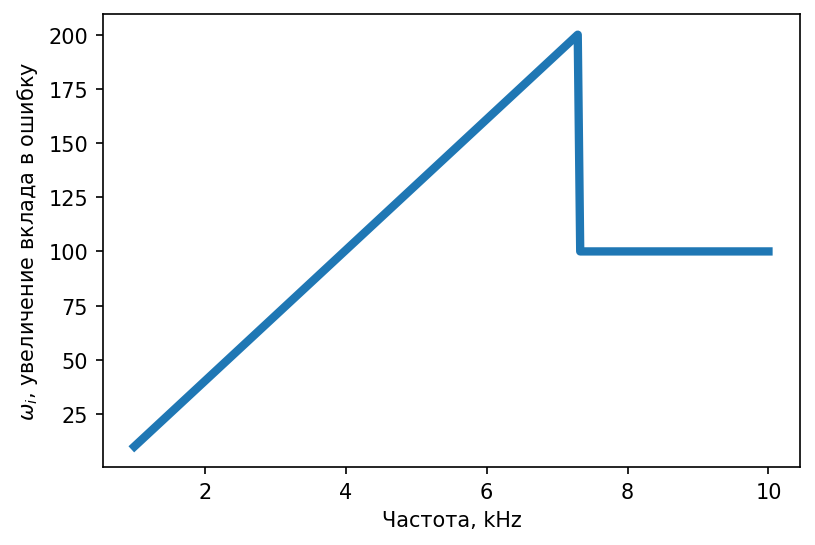

In [22]:
plt.figure(dpi=150)
plt.plot(np.linspace(1, 10, 257), weight_mask[:257], linewidth=4)
plt.xlabel("Частота, kHz")
plt.ylabel("$\omega_i$, увеличение вклада в ошибку")

In [23]:
def loss(pred, true, length=length):
    pred_fin = pred * weight_mask
    true_fin = true * weight_mask
    return  (tf.math.reduce_mean(tf.losses.mse(pred_fin, true_fin)))

## play functions

In [24]:
name_mp3 = ""
def play(mp3, name="rub"):
    global name_mp3
    name_mp3 = "WAV//" + name + ".wav"
    output.write_wav(name_mp3, mp3, sr)

In [25]:
def pred_true(gen, autoencoder):
    ex1, ex2 = next(gen)
    y = ex2[0]
    y = y.reshape(1, len(y), n_freq*2)
    y_pred = autoencoder(y).numpy()
    y_pred = y_pred.reshape(y_pred.shape[1])
    y_true = ex1[0]
    return y_pred, y_true

In [26]:
def pred_true_3D(gen):
    ex2, ex1 = next(gen)
    y = ex1[0]
    y = y.reshape(1, len(y), n_freq*2)
    y_pred_1 = autoencoder1(y).numpy()
    y_pred_1 = y_pred_1.reshape(y_pred_1.shape[1])
    y_pred_2 = autoencoder2(y).numpy()
    y_pred_2 = y_pred_2.reshape(y_pred_2.shape[1])
    y_pred_3 = autoencoder3(y).numpy()
    y_pred_3 = y_pred_3.reshape(y_pred_3.shape[1])
    y_true = ex2[0]
    return y_pred_1, y_pred_2, y_pred_3, y_true

# Autoencoder

In [27]:
input_mp3 = Input(shape=(None, 2*n_freq))

x = Conv1D(128, 16, activation=LeakyReLU(alpha=0.2), padding='same', name='L128')(input_mp3)
x = Conv1D(64,  32, activation=LeakyReLU(alpha=0.2), padding='same', name='L64')(x)
x = Conv1D(16,  32, activation=LeakyReLU(alpha=0.2), padding='same', name='L16_1')(x)
x = Conv1D(16,  32, activation=LeakyReLU(alpha=0.2), padding='same', name='L16_2')(x)
x = Conv1D(16,  32, activation=LeakyReLU(alpha=0.2), padding='same', name='L16_3')(x)
x = Conv1D(8,   32, activation=LeakyReLU(alpha=0.2), padding='same', name='L8__1')(x)
x = Conv1D(8,   32, activation=LeakyReLU(alpha=0.2), padding='same', name='L8_2')(x)
x = Conv1D(8,   32, activation=LeakyReLU(alpha=0.2), padding='same', name='L8_3')(x)
x = Conv1D(4,   32, activation=LeakyReLU(alpha=0.2), padding='same', name='L4_1')(x)
x = Conv1D(4,   32, activation='sigmoid',            padding='same', name='L4_2')(x)

encoded = x
encoder = Model(input_mp3, encoded)

In [28]:
enc_input = Input(shape=(None, 4))

x = enc_input

x = UpSampling1D(2)(x)
x = Conv1D(256, 8,   activation=LeakyReLU(alpha=0.2), padding='same', name='Ln1')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln2')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln2_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln3')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln3_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln4')(x)
x = Conv1D(64,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln5')(x)
x = UpSampling1D(2)(x)
x = Conv1D(32,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln6')(x)
x = Conv1D(16,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln7')(x)
x = UpSampling1D(2)(x)
x = Conv1D(8,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln8')(x)
x = Conv1D(4,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln9')(x)
x = UpSampling1D(2)(x)
x = Conv1D(2,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln10')(x)
x = Conv1D(2,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln11')(x)
x = Conv1D(1,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='Ln12')(x)


decoded = x
decoder1 = Model(enc_input, decoded)

In [29]:
enc_input = Input(shape=(None, 4))

x = enc_input

x = UpSampling1D(2)(x)
x = Conv1D(256, 8,   activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n1')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n2')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n2_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n3')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n3_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n4')(x)
x = Conv1D(64,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n5')(x)
x = UpSampling1D(2)(x)
x = Conv1D(32,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n6')(x)
x = Conv1D(16,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n7')(x)
x = UpSampling1D(2)(x)
x = Conv1D(8,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n8')(x)
x = Conv1D(4,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n9')(x)
x = UpSampling1D(2)(x)
x = Conv1D(2,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n10')(x)
x = Conv1D(2,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n11')(x)
x = Conv1D(1,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d2_n12')(x)

decoded = x
decoder2 = Model(enc_input, decoded)

In [30]:
enc_input = Input(shape=(None, 4))

x = enc_input

x = UpSampling1D(2)(x)
x = Conv1D(256, 8,   activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n1')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n2')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n2_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n3')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n3_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n4')(x)
x = Conv1D(64,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n5')(x)
x = UpSampling1D(2)(x)
x = Conv1D(32,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n6')(x)
x = Conv1D(16,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n7')(x)
x = UpSampling1D(2)(x)
x = Conv1D(8,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n8')(x)
x = Conv1D(4,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n9')(x)
x = UpSampling1D(2)(x)
x = Conv1D(2,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n10')(x)
x = Conv1D(2,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n11')(x)
x = Conv1D(1,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d3_n12')(x)

decoded = x
decoder3 = Model(enc_input, decoded)

In [31]:
enc_input = Input(shape=(None, 4))

x = enc_input

x = UpSampling1D(2)(x)
x = Conv1D(256, 8,   activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n1')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n2')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n2_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n3')(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n3_2')(x)
x = UpSampling1D(2)(x)
x = Conv1D(128, 8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n4')(x)
x = Conv1D(64,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n5')(x)
x = UpSampling1D(2)(x)
x = Conv1D(32,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n6')(x)
x = Conv1D(16,  8,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n7')(x)
x = UpSampling1D(2)(x)
x = Conv1D(8,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n8')(x)
x = Conv1D(4,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n9')(x)
x = UpSampling1D(2)(x)
x = Conv1D(2,   16,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n10')(x)
x = Conv1D(2,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n11')(x)
x = Conv1D(1,   32,  activation=LeakyReLU(alpha=0.2), padding='same', name='L_d4_n12')(x)

decoded = x
decoder4 = Model(enc_input, decoded)

In [32]:
enc1 = encoder(input_mp3)
dec1 = decoder1(enc1)
autoencoder1 = Model(input_mp3, dec1)
enc2 = encoder(input_mp3)
dec2 = decoder2(enc2)
autoencoder2 = Model(input_mp3, dec2)
enc3 = encoder(input_mp3)
dec3 = decoder3(enc3)
autoencoder3 = Model(input_mp3, dec3)
enc4 = encoder(input_mp3)
dec4 = decoder4(enc4)
autoencoder4 = Model(input_mp3, dec4)

In [33]:
# autoencoder1.summary()

# Custom train

In [34]:
frame_length=256
frame_step=128

In [35]:
@tf.function
def tf_stft(inp):
    print("Retrasing_1")
    stft = tf.signal.stft(inp, frame_length=frame_length, frame_step=frame_step, fft_length=512)
    stft_re = tf.math.real(stft)
    stft_im = tf.math.imag(stft)
    inp_in_draft = tf.concat([stft_re, stft_im], 2)
    inp_in = tf.concat([inp_in_draft, inp_in_draft[:, -2:-1]], 1)
    return inp_in

In [37]:
@tf.function
def train_on_batch2(inp1, inp2, inp3, inp4):
    print("Retraising_2")
    stddev = 0.05
    with tf.GradientTape() as tape1, tf.GradientTape() as tape2:
        tape1.watch(encoder.trainable_variables + \
                    decoder1.trainable_variables + \
                    decoder2.trainable_variables + \
                    decoder3.trainable_variables)
#         tape2.watch(classificator.trainable_variables)
        # STFT
        inp1_in = tf_stft(inp1)
        inp2_in = tf_stft(inp2)
        inp3_in = tf_stft(inp3)
        inp4_in = tf_stft(inp4)
        
        # DECODING
        decoded1 = decoder1(encoder(inp1_in))
        decoded2 = decoder2(encoder(inp2_in))
        decoded3 = decoder3(encoder(inp3_in))
        decoded4 = decoder4(encoder(inp4_in))
        
        f_dec_1 = tf.reshape(decoded1, [decoded1.shape[0], decoded1.shape[1]])
        f_dec_2 = tf.reshape(decoded2, [decoded2.shape[0], decoded2.shape[1]])
        f_dec_3 = tf.reshape(decoded3, [decoded3.shape[0], decoded3.shape[1]])
        f_dec_4 = tf.reshape(decoded4, [decoded3.shape[0], decoded3.shape[1]])
        
        # STFT decoded file
        inp1_out = tf_stft(f_dec_1)
        inp2_out = tf_stft(f_dec_2)
        inp3_out = tf_stft(f_dec_3)
        inp4_out = tf_stft(f_dec_4)
        
        # LOSS 
        l1 = loss(inp1_in, inp1_out)
        l2 = loss(inp2_in, inp2_out)
        l3 = loss(inp3_in, inp3_out)
        l4 = loss(inp4_in, inp4_out)
        L = (l1 + l2 + l3 + l4)/4
    enc_grad = tape1.gradient(L, 
                              encoder.trainable_variables + \
                              decoder1.trainable_variables+ \
                              decoder2.trainable_variables+ \
                              decoder3.trainable_variables+ \
                              decoder4.trainable_variables)
    adam.apply_gradients(zip(enc_grad, 
                             encoder.trainable_variables + \
                             decoder1.trainable_variables+ \
                             decoder2.trainable_variables+ \
                             decoder3.trainable_variables+ \
                             decoder4.trainable_variables))
    return L, l1, l2, l3, l4

In [38]:
%%timeit
inp1, _ = next(mp3_gen1)
inp2, _ = next(mp3_gen2)
inp3, _ = next(mp3_gen3)
inp4, _ = next(mp3_gen4)
l, l1, l2, l3, l4 = train_on_batch2(inp1, inp2, inp3, inp4)

Retraising_2
Retrasing_1
Retraising_2
1.18 s ± 394 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


# Train

In [86]:
autoencoder1.load_weights("4DICT_4_a1_v2.h5")
autoencoder2.load_weights("4DICT_4_a2_v2.h5")
autoencoder3.load_weights("4DICT_4_a3_v2.h5")
autoencoder4.load_weights("4DICT_4_a4_v2.h5")

$\text{mean_loss} =  534$

In [113]:
steps_per_epoch = 100
epochs = 60*48
print_rate_1 = 5
history = []
history1 = []
history2 = []
history3 = []
history4 = []
m_history = []
for epoch in range(epochs):
    for step in range(steps_per_epoch):
        start_gen = time()
        inp1, name1 = next(mp3_gen1)
        inp2, name2 = next(mp3_gen2)
        inp3, name3 = next(mp3_gen3)
        inp4, name4 = next(mp3_gen4)
        end_gen = time()
        start = time()
        l, l1, l2, l3, l4  = train_on_batch2(inp1, inp2, inp3, inp4)
        final = time()
        if not (step)%print_rate_1:
            history.append([l, [name1, name2, name3, name4]])
            history1.append(l1)
            history2.append(l2)
            history3.append(l3)
            history4.append(l4)
            ipd.clear_output(wait=True)
            mean_loss = np.mean([history[k][0] for k in range(len(history))])
            print("epoch   = %d"%(epoch) + " / %d \n"%epochs + \
                  "step    = %d"%(step ) + " / %d \n"%steps_per_epoch + \
                  "------------------- \n" + \
                  "t(gen)  = " + str((end_gen-start_gen))[:4] + "s\n" +\
                  "t(train)= " + str((final-start)/(1))[:4] + "s\n" +\
                  "t(tr ex)= " + str((final-start)/(1)/batch_size*1000)[:3] + "ms\n" +\
                  "t(all)  = " + str(final-start_gen)[:4] + "s\n" +\
                  "------------------- \n" + \
                  "m_loss  = " + str(mean_loss) + "\n" +\
                  "------------------- \n" + \
                  "loss1   = " + str(int(history1[-1])//10) + "\n" +\
                  "loss2   = " + str(int(history2[-1])//10) + "\n" +\
                  "loss3   = " + str(int(history3[-1])//10) + "\n" +\
                  "loss4   = " + str(int(history4[-1])//10) + "\n" +\
                  "-------------------" + "\n" +\
                  "names: " + \
                  history[-1][1][0] + "\n       " + \
                  history[-1][1][1]  + "\n       " + \
                  history[-1][1][2]  + "\n       " + \
                  history[-1][1][3] )
    m_history.append(mean_loss)

    autoencoder1.save_weights("4DICT_4_a1_v20.h5")
    autoencoder2.save_weights("4DICT_4_a2_v20.h5")
    autoencoder3.save_weights("4DICT_4_a3_v20.h5")
    autoencoder4.save_weights("4DICT_4_a4_v20.h5")

epoch   = 663 / 2880 
step    = 60 / 100 
------------------- 
t(gen)  = 0.02s
t(train)= 0.94s
t(tr ex)= 29.ms
t(all)  = 0.96s
------------------- 
m_loss  = 433.9047
------------------- 
loss1   = 35
loss2   = 42
loss3   = 34
loss4   = 58
-------------------
names: data_tern_2//141.npy
       data_borz_2//152.npy
       data_voro_3//34.npy
       data_eriz_1//209.npy


KeyboardInterrupt: 

In [354]:
autoencoder1.save_weights("4DICT_4_a1_v8.h5")
autoencoder2.save_weights("4DICT_4_a2_v8.h5")
autoencoder3.save_weights("4DICT_4_a3_v8.h5")
autoencoder4.save_weights("4DICT_4_a4_v8.h5")

# График

In [37]:
y1, y2 = pred_true(gen2, autoencoder2)

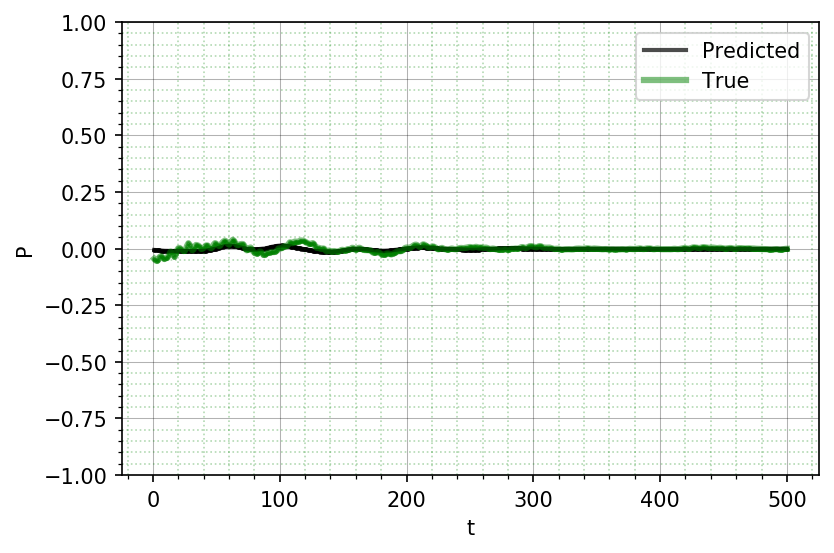

In [213]:
y1, y2 = pred_true(gen2, autoencoder1)
# y1, y2 = D1A1, D3A1

N = 500
i = 5
X = np.linspace(1, N, N)

fig, ax = plt.subplots(dpi=150)
# plt.figure(dpi=150)
plt.plot(X, y1[i*N:(i+1)*N], alpha=0.7, color="k", linewidth=2, label="Predicted")
plt.plot(X, y2[i*N:(i+1)*N], alpha=0.5, color="g", linewidth=3, label="True")
plt.scatter(X, y1[i*N:(i+1)*N], alpha=0.7, color="k", s=2)
plt.scatter(X, y2[i*N:(i+1)*N], alpha=0.5, color="g", s=2)
plt.ylim(-1, 1)

ax.minorticks_on()

ax.grid(which='major',
        color = 'k', 
        linewidth = 0.5,
       alpha = 0.3)
ax.grid(which='minor', 
        color = 'g', 
        linestyle = ':',
       alpha = 0.3)

plt.ylabel('P')
plt.xlabel('t')
plt.legend()
plt.show()

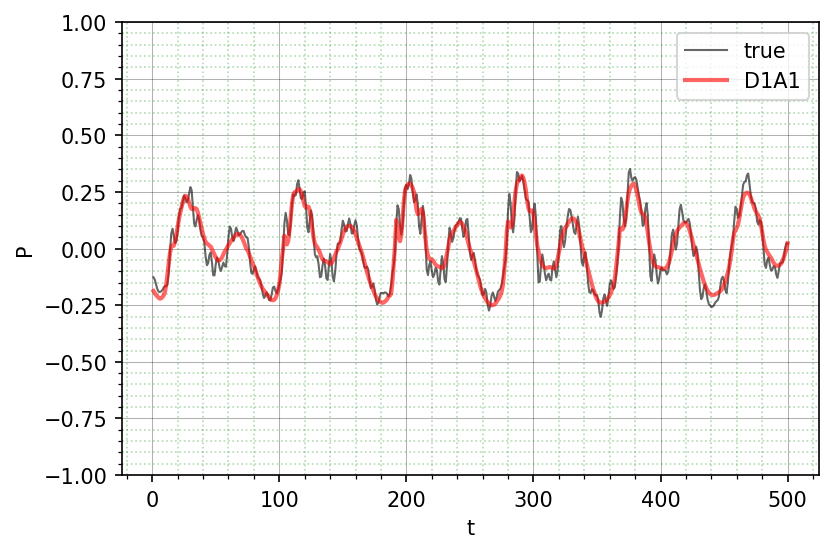

In [326]:
D1A1, D2A1, D3A1, A1 = pred_true_3D(gen1)
y1, y2, y3 = D1A1, A1, D3A1

N = 500
i = 5
X = np.linspace(1, N, N)

fig, ax = plt.subplots(dpi=150)
# plt.figure(dpi=150)
plt.plot(X, y2[i*N:(i+1)*N], alpha=0.6, color="k", linewidth=1, label="true")
plt.plot(X, y1[i*N:(i+1)*N], alpha=0.6, color="r", linewidth=2, label="D1A1")
# plt.plot(X, y3[i*N:(i+1)*N], alpha=0.6, color="b", linewidth=2, label="D3A1")
plt.ylim(-1, 1)

ax.minorticks_on()

ax.grid(which='major',
        color = 'k', 
        linewidth = 0.5,
       alpha = 0.3)
ax.grid(which='minor', 
        color = 'g', 
        linestyle = ':',
       alpha = 0.3)

plt.ylabel('P')
plt.xlabel('t')
plt.legend()
plt.show()

# Спектр

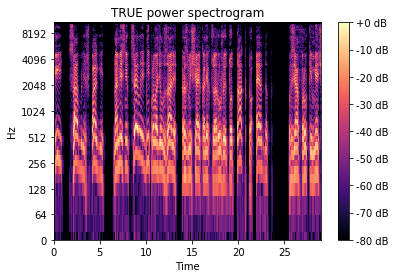

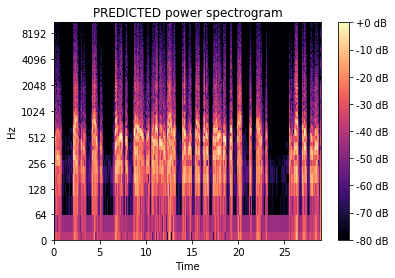

In [211]:
y1, y2 = pred_true(gen2, autoencoder1)
y1_spectr =  np.abs(librosa.core.stft(y1, n_fft=512))
y2_spectr =  np.abs(librosa.core.stft(y2, n_fft=512))

max_freq_spect = 180
# y2_spectr[max_freq_spect:257] = np.zeros((257-max_freq_spect,1))*y1_spectr[max_freq_spect:257]

plt.figure()
librosa.display.specshow(
    librosa.amplitude_to_db(y2_spectr, ref=np.max),
    y_axis='log', x_axis='time')
plt.title('TRUE power spectrogram')
plt.colorbar(format='%+2.0f dB')

plt.figure()
librosa.display.specshow(
    librosa.amplitude_to_db(y1_spectr, ref=np.max),
    y_axis='log', x_axis='time')
plt.title('PREDICTED power spectrogram')
plt.colorbar(format='%+2.0f dB')

# Play

## \textbf{Моби Дик}

In [104]:
D1A1, D2A1, D3A1, A1 = pred_true_3D(gen1)

In [105]:
play(D1A1, name="D1A1")
ipd.Audio(name_mp3)

In [106]:
play(D2A1, name="D2A1")
ipd.Audio(name_mp3)

In [107]:
play(D3A1, name="D3A1")
ipd.Audio(name_mp3)

In [108]:
play(A1, name="A1") #A1
ipd.Audio(name_mp3)

## \textbf{Карамазовы}

In [97]:
D1A2, D2A2, D3A2, A2 = pred_true_3D(gen2)

In [98]:
play(D1A2, name="D1A2")
ipd.Audio(name_mp3)

In [99]:
play(D2A2, name="D2A2")
ipd.Audio(name_mp3)

In [95]:
play(D3A2, name="D3A2")
ipd.Audio(name_mp3)

In [96]:
play(A2, name="A2")
ipd.Audio(name_mp3)

## \textbf{Джейн Эйр}

In [278]:
D1A3, D2A3, D3A3, A3 = pred_true_3D(gen3)

In [279]:
play(D1A3, name="D1A3")
ipd.Audio(name_mp3)

In [280]:
play(D2A3, name="D2A3")
ipd.Audio(name_mp3)

In [281]:
play(D3A3, name="D3A3")
ipd.Audio(name_mp3)

In [282]:
play(A3, name="A3")
ipd.Audio(name_mp3)

# History

300 -- 12 h

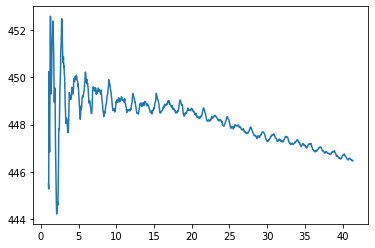

In [336]:
a = 0
b = None

n = len(m_history)
# 25 -- h
X = np.linspace(1, n/25, n)
plt.plot(X[a:b], m_history[a:b])

In [337]:
np.save('m_history_5.npy', np.array(m_history))

In [40]:
arr = np.load('m_history_4.npy')

In [83]:
ans = arr*2.3-680

Text(0, 0.5, 'Ошибка')

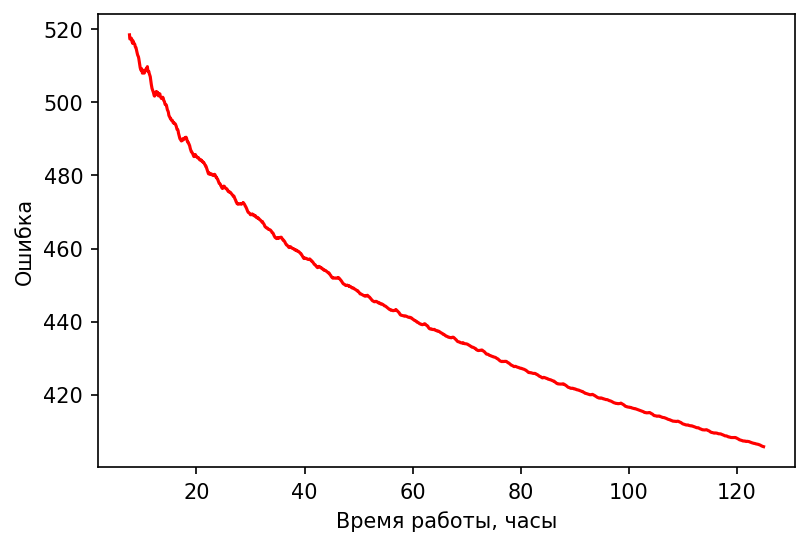

In [85]:
a = 100
b = None

n = len(ans)
# 20 -- h
X = np.linspace(1, n/15, n)
plt.figure(dpi=150)
plt.plot(X[a:b], ans[a:b], color='r')
plt.xlabel("Время работы, часы")
plt.ylabel('Ошибка')

# Черновик

In [319]:
ex, name = next(mp3_gen3)

In [48]:
import pandas as pd

In [49]:
data = pd.DataFrame(history)

In [54]:
data[133][1]

[<tf.Tensor: id=1542185, shape=(), dtype=float32, numpy=524.3551>,
 <tf.Tensor: id=1542186, shape=(), dtype=float32, numpy=564.2397>,
 <tf.Tensor: id=1542187, shape=(), dtype=float32, numpy=351.49527>,
 <tf.Tensor: id=1542188, shape=(), dtype=float32, numpy=527.122>,
 <tf.Tensor: id=1542189, shape=(), dtype=float32, numpy=654.56354>,
 ['data_tern_1//30.npy',
  'data_borz_2//43.npy',
  'data_voro_3//15.npy',
  'data_eriz_1//43.npy']]

In [109]:
import tensorboard